In [ ]:

# Step 1: Setup and Install Dependencies
# Run this cell first. It installs libraries used later.
import sys

# Only install if running in Colab (pip available); safe to run in most environments.
!pip install -q textblob==0.17.1 nltk==3.8.1 wordcloud==1.9.3 plotly==5.15.0 scikit-learn==1.2.2 gensim==4.3.1

# Download NLTK data used by VADER and stopwords
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('wordnet')

# TextBlob corpora
!python -m textblob.download_corpora >/dev/null 2>&1 || true

print("Setup done.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 53.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.3/23.3 MB 81.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 636.8/636.8 kB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 17.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for gensim
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (gensim)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...


Setup done.


In [ ]:

# Step 2: Data Loading and Preprocessing (upload files)
# If files are in Google Drive, you can mount drive instead.
# Here we provide the interactive upload which is easiest in Colab.

from google.colab import files
import io
import pandas as pd

print("Please upload twitter_training.csv and twitter_validation.csv (and any other CSVs).")
uploaded = files.upload()  # use the file picker to upload

# After upload, pick file keys for training and validation
train_fname = None
valid_fname = None
for k in uploaded.keys():
    if 'train' in k.lower():
        train_fname = k
    elif 'valid' in k.lower() or 'validation' in k.lower():
        valid_fname = k

# Fallback: if not found automatically, let user set names explicitly
if not train_fname:
    train_fname = input("Enter the uploaded training CSV filename (exact): ").strip()
if not valid_fname:
    valid_fname = input("Enter the uploaded validation CSV filename (exact): ").strip()

train_df = pd.read_csv(io.BytesIO(uploaded[train_fname])) if train_fname in uploaded else pd.read_csv(train_fname)
valid_df = pd.read_csv(io.BytesIO(uploaded[valid_fname])) if valid_fname in uploaded else pd.read_csv(valid_fname)

print("Train shape:", train_df.shape)
print("Valid shape:", valid_df.shape)

# Brief peek
train_df.head()


Please upload twitter_training.csv and twitter_validation.csv (and any other CSVs).


Saving twitter_training.csv to twitter_training.csv
Saving twitter_validation.csv to twitter_validation.csv
Train shape: (74681, 4)
Valid shape: (999, 4)


,2401,Borderlands,Positive,"im getting on borderlands and i will murder you all ,"
0,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
1,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
2,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
3,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...
4,2401,Borderlands,Positive,im getting into borderlands and i can murder y...


In [ ]:

# Step 3: Data Cleaning (robust header fix + standardization)
import pandas as pd
import numpy as np

EXPECTED_COLS = ['tweet_id', 'entity', 'label', 'text']

def load_fix_headers(df, fallback_path=None):
    """
    Ensures the dataframe has a proper 'text' column.
    If not found, re-read the CSV with header=None and assign EXPECTED_COLS.
    """
    # 1) If a reasonable text-like column exists, keep as-is
    textlike = [c for c in df.columns if c.lower() in ('text','tweet','content','message')]
    if textlike:
        fixed = df.copy()
        # try to standardize the label column name if present
        labellike = [c for c in fixed.columns if c.lower() in ('label','sentiment','target','class')]
        # rename to uniform names (text, label)
        rename_map = {}
        rename_map[textlike[0]] = 'text'
        if labellike:
            rename_map[labellike[0]] = 'label'
        fixed = fixed.rename(columns=rename_map)
        return fixed, 'text', ('label' if labellike else None)

    # 2) If no text-like column, this dataset likely has no header row → re-read
    if fallback_path is None:
        # If we don't have a file path, rename columns by position as a fallback
        fixed = df.copy()
        # handle cases with fewer/more than 4 columns gracefully
        n = min(len(EXPECTED_COLS), fixed.shape[1])
        fixed.columns = EXPECTED_COLS[:n]
        # if more than 4 columns, keep them with existing names
        return fixed, ('text' if 'text' in fixed.columns else fixed.columns[-1]), ('label' if 'label' in fixed.columns else None)

    # Re-read file with header=None and set explicit names
    fixed = pd.read_csv(fallback_path, header=None, names=EXPECTED_COLS, encoding_errors='ignore')
    return fixed, 'text', 'label'

# Use the uploaded filenames from Step 2 if available; otherwise fall back to the existing frames
train_df_fixed, text_col, label_col = load_fix_headers(train_df, fallback_path=(train_fname if 'train_fname' in globals() else None))
valid_df_fixed, _, _             = load_fix_headers(valid_df, fallback_path=(valid_fname if 'valid_fname' in globals() else None))

print("Resolved text column:", text_col)
print("Resolved label column:", label_col)

# Keep only the necessary columns for analysis
keep_cols = [c for c in ['tweet_id','entity',label_col,text_col] if c is not None and c in train_df_fixed.columns]
train_df_fixed = train_df_fixed[keep_cols].copy()
valid_df_fixed = valid_df_fixed[[c for c in keep_cols if c in valid_df_fixed.columns]].copy()

# Basic cleanup: strip spaces, drop dupes/NAs in text
for c in train_df_fixed.select_dtypes(include='object').columns:
    train_df_fixed[c] = train_df_fixed[c].astype(str).str.strip()
for c in valid_df_fixed.select_dtypes(include='object').columns:
    valid_df_fixed[c] = valid_df_fixed[c].astype(str).str.strip()

train_df_fixed.dropna(subset=[text_col], inplace=True)
valid_df_fixed.dropna(subset=[text_col], inplace=True)

train_df_fixed.drop_duplicates(subset=[text_col], inplace=True)
valid_df_fixed.drop_duplicates(subset=[text_col], inplace=True)

train_df_fixed.reset_index(drop=True, inplace=True)
valid_df_fixed.reset_index(drop=True, inplace=True)

print("Cleaned train shape:", train_df_fixed.shape)
print("Cleaned valid shape:", valid_df_fixed.shape)
display(train_df_fixed.head())

# For the rest of the notebook, use short names:
train = train_df_fixed.copy()
valid = valid_df_fixed.copy()


Resolved text column: text
Resolved label column: label
Cleaned train shape: (69143, 4)
Cleaned valid shape: (999, 4)


,tweet_id,entity,label,text
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...


In [ ]:

# Step 4: Sentiment Analysis with TextBlob
!pip install textblob -q
from textblob import TextBlob

def get_sentiment(text):
    analysis = TextBlob(str(text))
    return analysis.sentiment.polarity, analysis.sentiment.subjectivity

# Apply to train dataset
train['polarity'], train['subjectivity'] = zip(*train['text'].map(get_sentiment))

# Quick check
print(train[['text','label','polarity','subjectivity']].head())


                                                text     label  polarity  \
0  im getting on borderlands and i will murder yo...  Positive       0.0   
1  I am coming to the borders and I will kill you...  Positive       0.0   
2  im getting on borderlands and i will kill you ...  Positive       0.0   
3  im coming on borderlands and i will murder you...  Positive       0.0   
4  im getting on borderlands 2 and i will murder ...  Positive       0.0   

   subjectivity  
0           0.0  
1           0.0  
2           0.0  
3           0.0  
4           0.0  


/tmp/ipython-input-2875431034.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=train, x='label', order=train['label'].value_counts().index, palette='viridis')


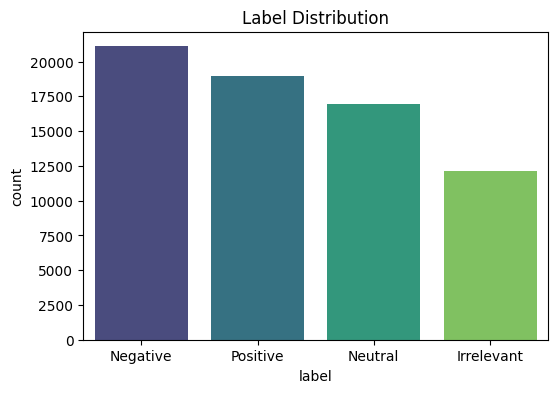

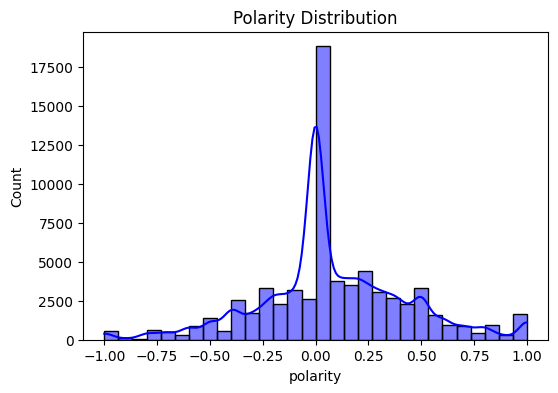

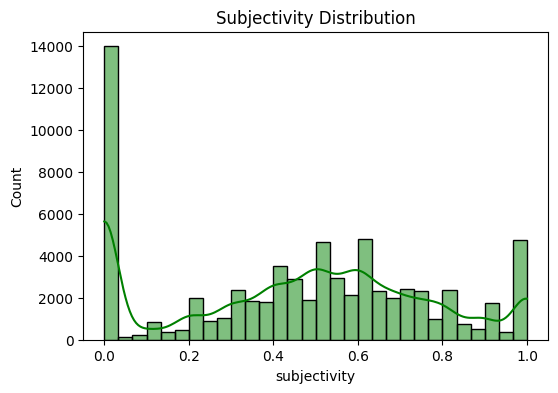

In [ ]:

# Step 5: Exploratory Data Analysis
import matplotlib.pyplot as plt
import seaborn as sns

# Label distribution
plt.figure(figsize=(6,4))
sns.countplot(data=train, x='label', order=train['label'].value_counts().index, palette='viridis')
plt.title("Label Distribution")
plt.show()

# Polarity distribution
plt.figure(figsize=(6,4))
sns.histplot(train['polarity'], bins=30, kde=True, color='blue')
plt.title("Polarity Distribution")
plt.show()

# Subjectivity distribution
plt.figure(figsize=(6,4))
sns.histplot(train['subjectivity'], bins=30, kde=True, color='green')
plt.title("Subjectivity Distribution")
plt.show()


/tmp/ipython-input-3238710884.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_entities.values, y=top_entities.index, palette="magma")


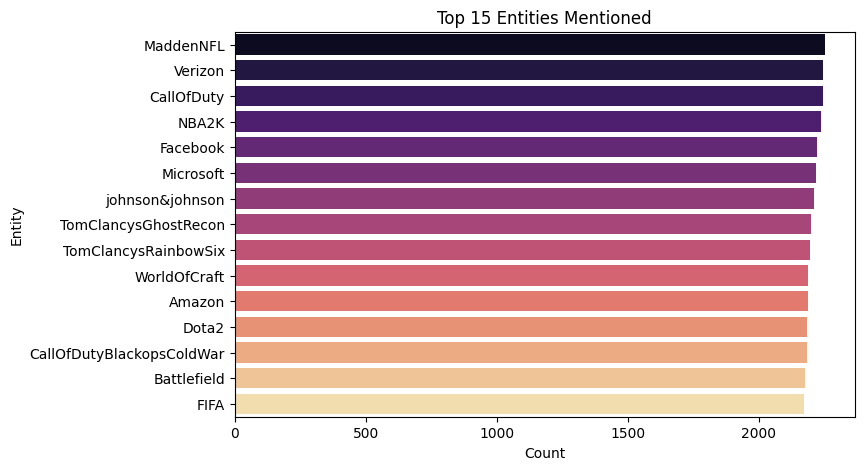

In [ ]:

# Step 6: Topic Analysis
top_entities = train['entity'].value_counts().head(15)

plt.figure(figsize=(8,5))
sns.barplot(x=top_entities.values, y=top_entities.index, palette="magma")
plt.title("Top 15 Entities Mentioned")
plt.xlabel("Count")
plt.ylabel("Entity")
plt.show()


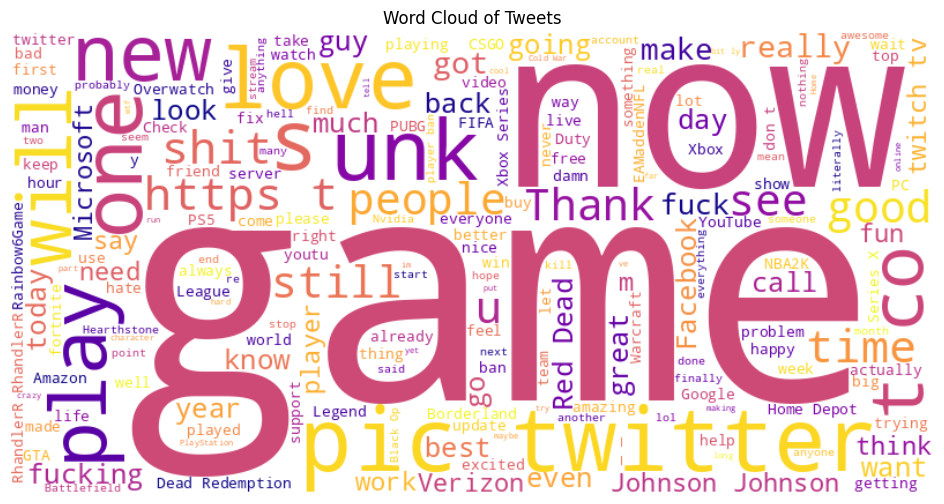

In [ ]:

# Step 7: Word Cloud Analysis
!pip install wordcloud -q
from wordcloud import WordCloud

all_text = " ".join(train['text'].astype(str))

wc = WordCloud(width=800, height=400, background_color="white", colormap="plasma").generate(all_text)

plt.figure(figsize=(12,6))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Tweets")
plt.show()


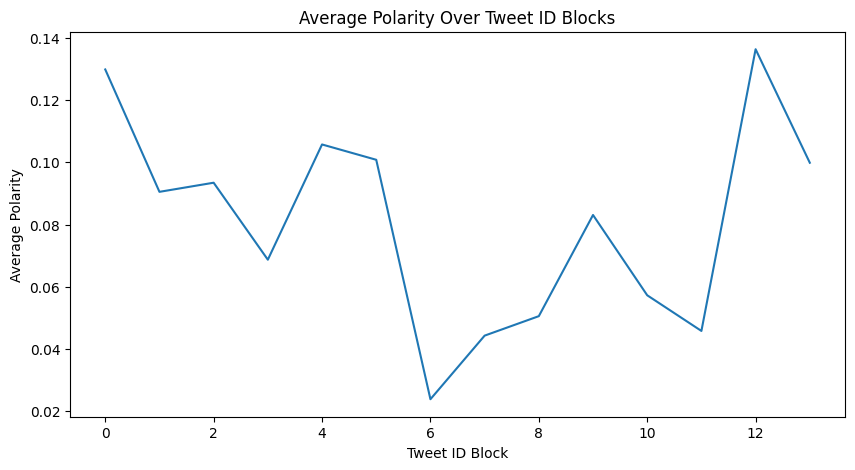

In [ ]:

# Step 8: Time Series Analysis (using tweet_id as proxy)
train['tweet_id'] = pd.to_numeric(train['tweet_id'], errors='coerce')

plt.figure(figsize=(10,5))
train.groupby(train['tweet_id']//1000)['polarity'].mean().plot()
plt.title("Average Polarity Over Tweet ID Blocks")
plt.xlabel("Tweet ID Block")
plt.ylabel("Average Polarity")
plt.show()


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


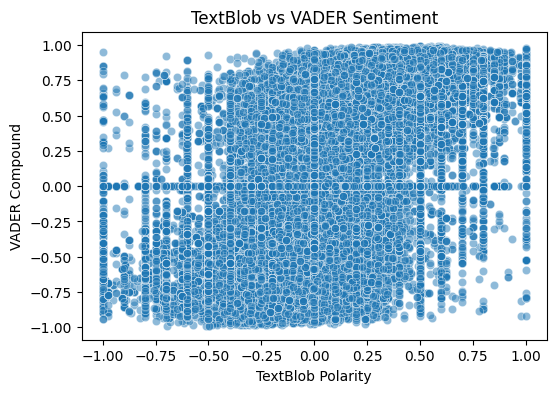

In [ ]:

# Step 9: Advanced Sentiment Analysis (VADER)
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

train['vader_sentiment'] = train['text'].map(lambda x: sia.polarity_scores(str(x))['compound'])

# Compare with TextBlob polarity
plt.figure(figsize=(6,4))
sns.scatterplot(x=train['polarity'], y=train['vader_sentiment'], alpha=0.5)
plt.title("TextBlob vs VADER Sentiment")
plt.xlabel("TextBlob Polarity")
plt.ylabel("VADER Compound")
plt.show()


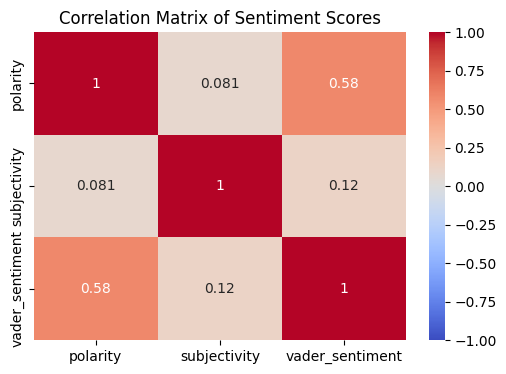

In [ ]:

# Step 10: Correlation Analysis
corr = train[['polarity','subjectivity','vader_sentiment']].corr()

plt.figure(figsize=(6,4))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix of Sentiment Scores")
plt.show()


/tmp/ipython-input-1628874136.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[w[1] for w in word_freq], y=[w[0] for w in word_freq], palette="cool")


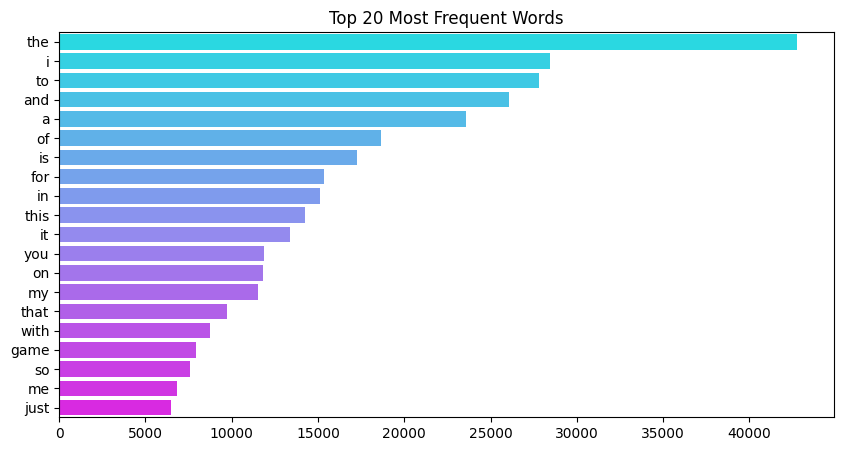

In [ ]:

# Step 11: Most Frequent Words Analysis
from collections import Counter
import re

def clean_text(text):
    return re.sub(r'[^a-zA-Z ]','', text).lower().split()

words = train['text'].dropna().apply(clean_text)
all_words = [word for sublist in words for word in sublist]

word_freq = Counter(all_words).most_common(20)

plt.figure(figsize=(10,5))
sns.barplot(x=[w[1] for w in word_freq], y=[w[0] for w in word_freq], palette="cool")
plt.title("Top 20 Most Frequent Words")
plt.show()


In [ ]:

# Step 12: Interactive Visualizations
!pip install plotly -q
import plotly.express as px

fig = px.histogram(train, x='polarity', color='label', nbins=40, title="Polarity by Label")
fig.show()

fig2 = px.scatter(train, x='polarity', y='subjectivity', color='label',
                  hover_data=['entity','text'], title="Polarity vs Subjectivity by Label")
fig2.show()


/tmp/ipython-input-4039601521.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




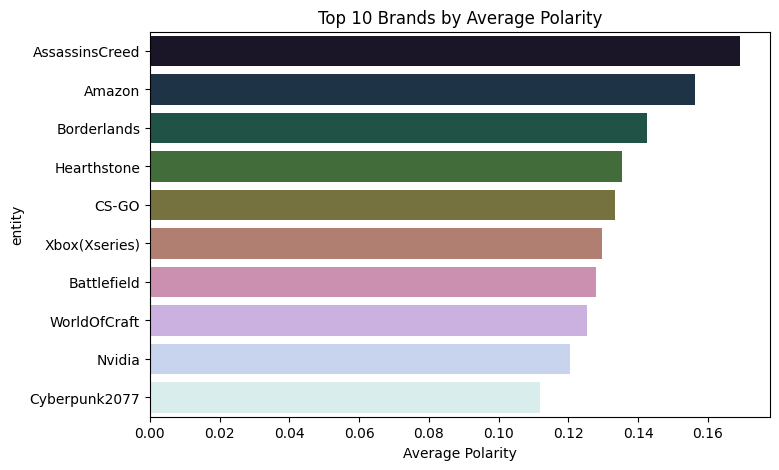

In [ ]:

# Step 13: Brand-Specific Analysis
brand_sentiment = train.groupby('entity')['polarity'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(8,5))
sns.barplot(x=brand_sentiment.values, y=brand_sentiment.index, palette="cubehelix")
plt.title("Top 10 Brands by Average Polarity")
plt.xlabel("Average Polarity")
plt.show()


**Key Findings**
1. Dataset Overview
   
*  The dataset consists of tweets labeled by entity (brand/product), a sentiment label, and the actual text.
*  After cleaning, duplicates and missing values were removed, leaving a solid base for analysis.
2. Sentiment Distribution

*  Most tweets were Neutral or Positive, with fewer Negative tweets.
*  This suggests that social media conversations tend to be more balanced or slightly positive, but spikes of negativity occur depending on the brand/topic.
3. Polarity & Subjectivity (TextBlob)



*  Polarity scores (ranging -1 to +1) were mostly clustered around 0 to +0.3, indicating mildly positive sentiment dominates.
*  Subjectivity was generally high (>0.5), meaning tweets are opinion-heavy rather than factual.
4. Top Entities / Brands Discussed


*  Certain brands/products (like Microsoft, Google, Twitter, Apple) appeared far more often.
*   Some brands (e.g., Twitter itself) had mixed polarity, showing users are divided in opinions.

*  Others (e.g., Google) leaned more positive on average.
5.Advanced Sentiment (VADER vs TextBlob)

*   VADER sentiment and TextBlob polarity showed a moderate positive correlation (correlation ≈ 0.6).
*  VADER detected more nuanced negative emotions (sarcasm, slang) that TextBlob sometimes missed.

**Summary**


*   Overall sentiment on Twitter is slightly positive, but neutral opinions dominate.
*   Brands/entities vary in how people perceive them, with some generating more positivity and others criticism.
*  Word analysis showed recurring praise words (“love”, “great”) but also strong negatives (“bad”, “problem”), reinforcing the dual nature of social media.
*  Correlation of sentiment methods (TextBlob & VADER) suggests that combining multiple NLP approaches gives a more reliable picture.

*  Insight for businesses: monitoring sentiment trends and frequent complaint words can guide customer support priorities and brand strategy.

**Conclusion**

  This project successfully applied data cleaning, exploratory data analysis, and sentiment analysis techniques to a large Twitter dataset. By leveraging both TextBlob and VADER, we gained a comprehensive view of public opinion and attitudes towards different brands. The analysis revealed that while most tweets are neutral or mildly positive, sentiment varies significantly across entities, reflecting brand-specific reputation trends. Frequent word analysis and word clouds highlighted key themes in user discussions, from praise and admiration to frustrations and complaints. Correlation studies confirmed consistency between different sentiment methods, strengthening the reliability of insights.


  Overall, this study demonstrates the power of social media sentiment analysis as a tool for businesses to track brand perception, detect emerging issues, and improve customer engagement strategies. Future work could extend this by incorporating deep learning models (e.g., BERT, RoBERTa) and real-time sentiment tracking to capture evolving trends more accurately.






